In [50]:
from os.path import join
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier

from minisom import MiniSom


In [51]:
## Import Matplotlib functions to create MiniSOM visualizations

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib.colors import LinearSegmentedColormap

from matplotlib.lines import Line2D
import seaborn as sns

from matplotlib import __version__ as mplver

In [52]:
df = pd.read_csv(join('..', 'data', 'processed_ABCDEats_data.csv'))

In [53]:
df.head()

#len(df.columns)

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,weekend_ratio,lunch_orders,dinner_orders,meal_preference,morning_orders,midday_orders,evening_orders,night_orders,drinking_orders,primary_time_period
0,1b8f824d5e,2360,18,2,5,1,0,1,DELIVERY,DIGI,...,1.0,0,2,dinner,0,0,2,0,0,evening
1,5d272b9dcb,8670,17,2,2,2,0,1,DISCOUNT,DIGI,...,1.0,1,0,lunch,1,1,0,0,0,morning
2,f6d1b2ba63,4660,38,1,2,2,0,1,DISCOUNT,CASH,...,1.0,1,0,lunch,1,1,0,0,0,morning
3,180c632ed8,4660,24,2,3,1,0,2,DELIVERY,DIGI,...,0.5,1,0,lunch,0,2,0,0,0,midday
4,4eb37a6705,4660,20,2,5,0,0,2,-,DIGI,...,0.5,0,0,dinner,2,0,0,0,0,morning


In [82]:
df[metric_features]

,customer_age,vendor_count,product_count,weekend_ratio,total_spending,total_orders,cuisine_diversity,lunch_orders,dinner_orders,morning_orders,midday_orders,evening_orders,night_orders,drinking_orders,is_chain
0,18,2,5,1.0,28,2,1,0,2,0,0,2,0,0,1
1,17,2,2,1.0,18,2,2,1,0,1,1,0,0,0,2
2,38,1,2,1.0,9,2,1,1,0,1,1,0,0,0,2
3,24,2,3,0.5,30,2,2,1,0,0,2,0,0,0,1
4,20,2,5,0.5,54,2,2,0,0,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31732,30,1,1,1.0,18,1,1,1,0,0,1,0,0,0,1
31733,27,1,1,1.0,18,1,1,0,0,0,0,1,0,0,0
31734,24,1,1,1.0,17,1,1,0,0,0,0,0,0,1,1
31735,34,1,1,1.0,12,1,1,1,0,0,1,0,0,0,0


In [54]:
df.columns

Index(['customer_id', 'customer_region', 'customer_age', 'vendor_count',
       'product_count', 'is_chain', 'first_order', 'last_order', 'last_promo',
       'payment_method', 'CUI_American', 'CUI_Asian', 'CUI_Beverages',
       'CUI_Cafe', 'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts',
       'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese',
       'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks',
       'CUI_Thai', 'DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5',
       'DOW_6', 'HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7',
       'HR_8', 'HR_9', 'HR_10', 'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15',
       'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23',
       'total_spending', 'total_orders', 'cuisine_diversity',
       'primary_cuisine', 'weekend_orders', 'underweekend_orders',
       'weekend_ratio', 'lunch_orders', 'dinner_orders', 'meal_preference',
       'morning_orders', 'midday_orders', 'evening_orde

In [55]:
metric_features = ['customer_age', 'vendor_count',
       'product_count','weekend_ratio','total_spending', 
       'total_orders', 'cuisine_diversity','lunch_orders', 
       'dinner_orders','morning_orders', 'midday_orders', 
       'evening_orders', 'night_orders',
       'drinking_orders','is_chain']

metric_features

len(metric_features)

15

In [56]:
# Some helper functions
def tidy_ax(ax, major_ticks, minor_ticks, minor_lim=None):

    ax.set_xticks(major_ticks-.5)
    ax.set_xticks(minor_ticks-.5, minor=True)

    ax.set_xticklabels([])
    ax.set_yticklabels([])

    ax.grid(which='both', alpha=0.5, color='white', linewidth=1)

    ax.tick_params(axis='both', which='both', direction="in", width=0, length=0)

    if minor_lim == None:
        minor_lim = major_ticks.max()

    ax.set_yticks(major_ticks[major_ticks<minor_lim]-.5, )
    ax.set_yticks(minor_ticks[minor_ticks<minor_lim]-.5, minor=True)
    
    ax.set_aspect(1)

    return ax

In [57]:
# Initialize Random Number Generator from numpy
rng = np.random.default_rng(638468314)

# Generate random colors using RGB code
random_colors = rng.uniform(0,1,(100,3)).round(2)
random_colors_df = pd.DataFrame(random_colors, columns=["R","G","B"])
random_colors_df.reset_index(inplace=True)

# Preview randomly generated colors
sns.color_palette(random_colors)

[(0.62, 0.27, 0.26),
 (0.95, 0.28, 0.52),
 (0.77, 0.52, 0.42),
 (0.88, 0.69, 0.65),
 (0.78, 0.55, 0.99),
 (0.32, 0.84, 0.95),
 (0.1, 0.8, 0.49),
 (0.17, 0.46, 0.13),
 (0.94, 0.43, 0.12),
 (0.65, 0.08, 0.49),
 (0.91, 0.84, 0.04),
 (0.36, 0.84, 0.49),
 (0.29, 0.56, 0.51),
 (0.4, 0.16, 0.88),
 (0.12, 0.07, 0.85),
 (0.07, 0.63, 0.06),
 (0.86, 0.5, 0.74),
 (0.23, 0.52, 0.3),
 (0.49, 0.69, 0.5),
 (0.03, 0.62, 0.16),
 (0.13, 0.59, 0.21),
 (0.72, 0.71, 0.76),
 (0.28, 0.86, 0.52),
 (0.74, 0.13, 0.26),
 (0.86, 0.24, 0.81),
 (0.86, 0.96, 0.12),
 (0.4, 0.6, 0.09),
 (0.82, 0.02, 0.47),
 (0.82, 0.39, 0.46),
 (0.56, 0.38, 0.41),
 (0.59, 0.56, 0.02),
 (0.77, 0.76, 0.04),
 (0.74, 0.47, 0.27),
 (0.17, 0.7, 0.42),
 (0.79, 0.67, 0.42),
 (0.55, 0.05, 0.97),
 (0.8, 0.43, 0.26),
 (0.09, 0.95, 0.14),
 (0.06, 0.8, 0.44),
 (0.99, 0.68, 0.4),
 (0.11, 0.62, 0.65),
 (0.58, 0.04, 0.81),
 (0.67, 0.84, 0.31),
 (0.23, 0.07, 0.86),
 (0.35, 0.6, 0.65),
 (0.02, 0.63, 0.11),
 (0.5, 0.23, 0.81),
 (0.75, 0.73, 0.12),
 (0.4, 0.87, 0.82),
 (0.1, 0.82, 0.38),
 (0.75, 0.06, 0.39),
 (0.78, 0.01, 0.4),
 (0.69, 0.0, 0.8),
 (0.29, 0.55, 0.63),
 (0.09, 0.33, 0.73),
 (0.7, 0.78, 0.62),
 (0.94, 0.46, 0.8),
 (0.99, 0.34, 0.24),
 (0.43, 0.3, 0.94),
 (0.47, 0.22, 0.9),
 (0.53, 0.55, 0.77),
 (0.43, 0.87, 0.81),
 (0.75, 0.39, 0.66),
 (0.19, 0.8, 0.28),
 (0.19, 0.02, 0.44),
 (0.78, 0.87, 0.57),
 (0.16, 0.24, 0.56),
 (0.2, 0.39, 0.1),
 (0.01, 0.29, 0.73),
 (0.65, 0.26, 0.65),
 (0.66, 0.35, 0.21),
 (0.32, 0.9, 0.47),
 (0.23, 0.1, 0.18),
 (0.63, 0.0, 0.19),
 (0.35, 0.05, 0.12),
 (0.62, 0.58, 0.11),
 (0.24, 0.97, 0.79),
 (0.39, 0.39, 0.86),
 (0.29, 0.69, 0.96),
 (0.34, 0.06, 0.96),
 (0.02, 0.61, 0.27),
 (0.65, 0.55, 0.12),
 (0.4, 0.76, 0.03),
 (0.74, 0.32, 0.45),
 (0.92, 0.07, 0.88),
 (0.77, 0.66, 0.6),
 (0.69, 0.66, 0.35),
 (0.02, 0.22, 0.89),
 (0.11, 0.65, 0.83),
 (0.75, 0.94, 0.6),
 (0.31, 0.8, 0.11),
 (0.71, 0.91, 0.15),
 (0.72, 0.96, 0.85),
 (0.89, 0.46, 0.97),
 (0.98, 0.1, 0.94),
 (0.2, 0.57, 0.75),
 (0.43, 0.11, 0.66),
 (0.15, 0.46, 0.74),
 (0.63, 0.14, 0.46),
 (0.31, 0.39, 0.94)]

In [58]:
# M = 0
# N = 0
# neighborhood_function = None 
# topology = None 
# n_feats = len(metric_features)
# learning_rate = None

M = 15
N = 15
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(metric_features)
learning_rate = .7


som_data = df[metric_features].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 


print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))



# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 20000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))


Before training:
QE 5.9868
TE 0.984
After training:
QE 4.7994
TE 0.4492


Visualization

In [59]:
# What are these weights?
weights = sm.get_weights()
weights.shape

(15, 15, 15)

In [60]:


def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=.5)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)




    return sf 

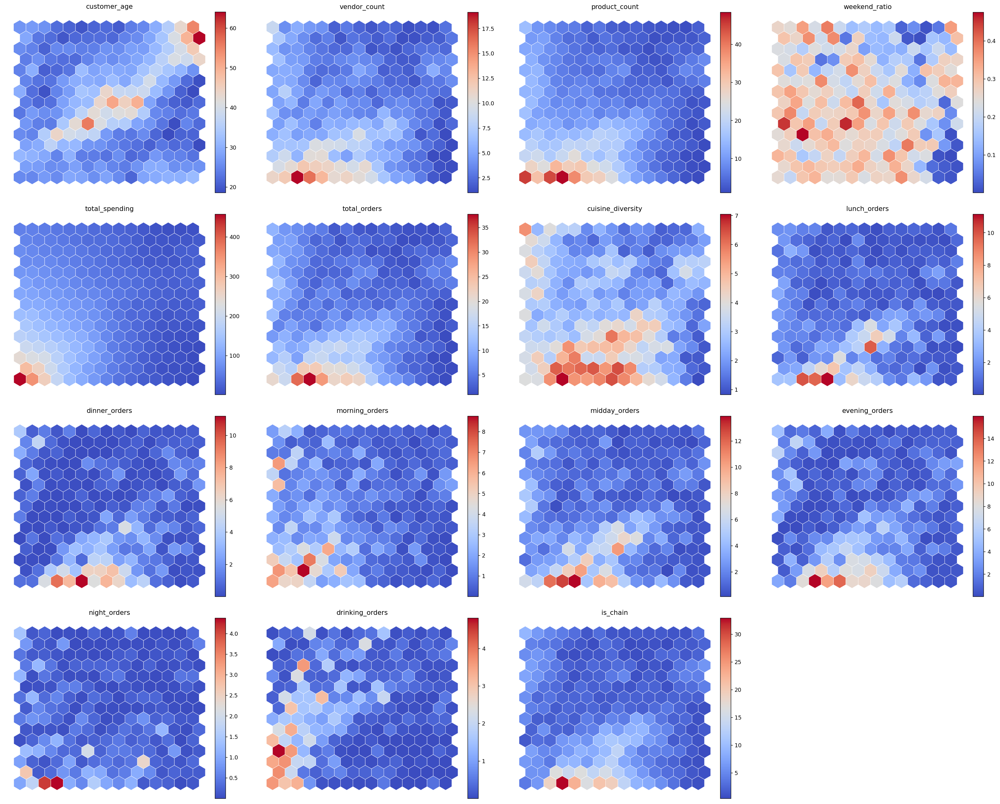

In [61]:
##############################
# Plot Component Planes
##############################

figsize=(25, 20)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(4,4,wspace=.05, hspace=.05)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(metric_features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    # colornorm = mpl_colors.CenteredNorm(vcenter=0, halfrange=vext)


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=metric_features[cpi],
                    cmap=cm.coolwarm,
                    )

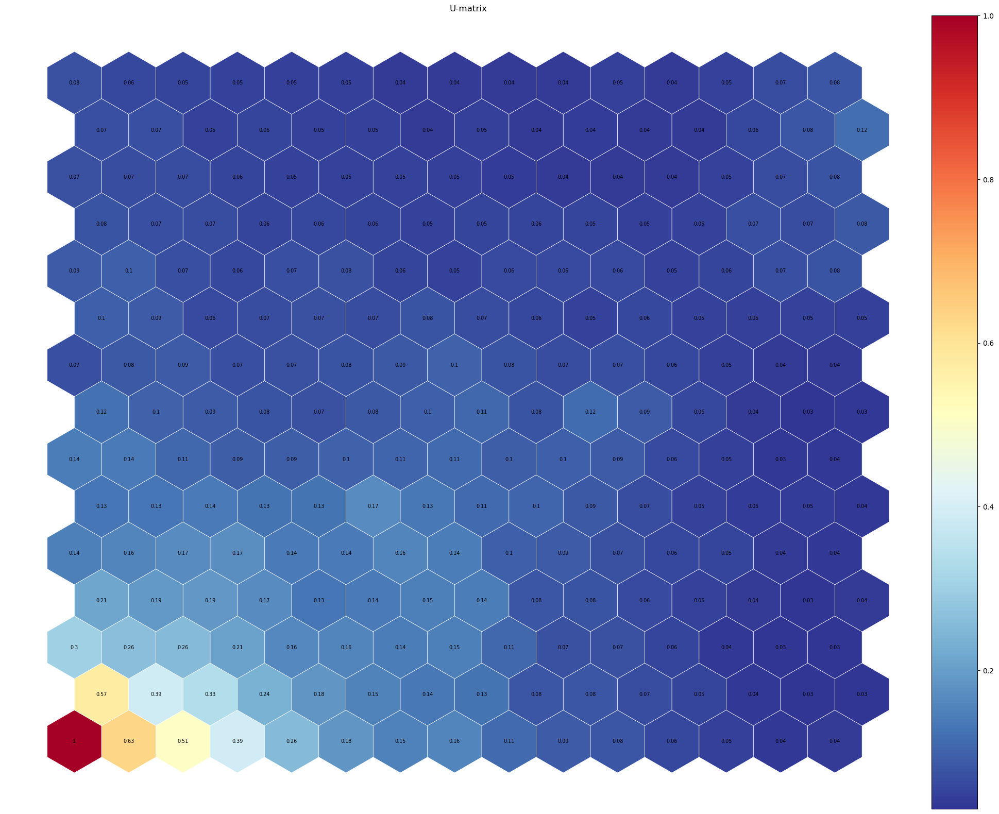

In [62]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=True
                    )

In [63]:
## Flip and rotate to match plot
print(np.flip(np.round(umatrix,2), axis=1).T)

[[0.08 0.06 0.05 0.05 0.05 0.05 0.04 0.04 0.04 0.04 0.05 0.04 0.05 0.07
  0.08]
 [0.07 0.07 0.05 0.06 0.05 0.05 0.04 0.05 0.04 0.04 0.04 0.04 0.06 0.08
  0.12]
 [0.07 0.07 0.07 0.06 0.05 0.05 0.05 0.05 0.05 0.04 0.04 0.04 0.05 0.07
  0.08]
 [0.08 0.07 0.07 0.06 0.06 0.06 0.05 0.05 0.06 0.05 0.05 0.05 0.07 0.07
  0.08]
 [0.09 0.1  0.07 0.06 0.07 0.08 0.06 0.05 0.06 0.06 0.06 0.05 0.06 0.07
  0.08]
 [0.1  0.09 0.06 0.07 0.07 0.07 0.08 0.07 0.06 0.05 0.06 0.05 0.05 0.05
  0.05]
 [0.07 0.08 0.09 0.07 0.07 0.08 0.09 0.1  0.08 0.07 0.07 0.06 0.05 0.04
  0.04]
 [0.12 0.1  0.09 0.08 0.07 0.08 0.1  0.11 0.08 0.12 0.09 0.06 0.04 0.03
  0.03]
 [0.14 0.14 0.11 0.09 0.09 0.1  0.11 0.11 0.1  0.1  0.09 0.06 0.05 0.03
  0.04]
 [0.13 0.13 0.14 0.13 0.13 0.17 0.13 0.11 0.1  0.09 0.07 0.05 0.05 0.05
  0.04]
 [0.14 0.16 0.17 0.17 0.14 0.14 0.16 0.14 0.1  0.09 0.07 0.06 0.05 0.04
  0.04]
 [0.21 0.19 0.19 0.17 0.13 0.14 0.15 0.14 0.08 0.08 0.06 0.05 0.04 0.03
  0.04]
 [0.3  0.26 0.26 0.21 0.16 0.16 0.14 0.1

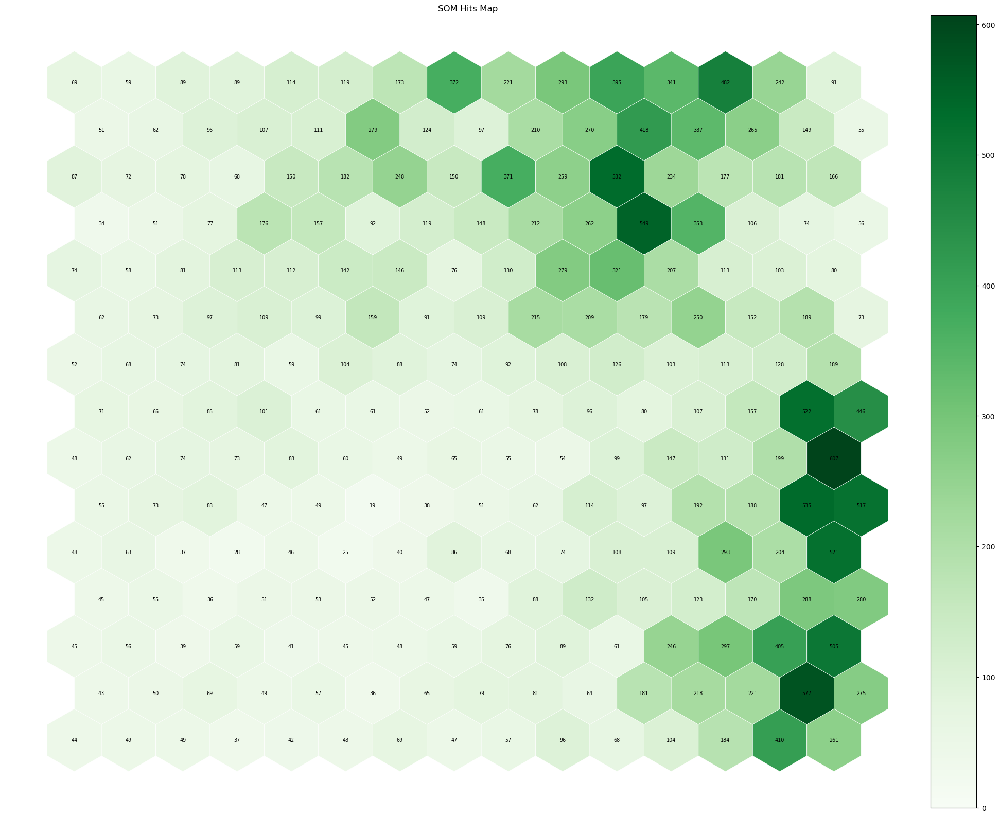

In [64]:
hitsmatrix = sm.activation_response(df[metric_features].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=True
                    )


## Clustering with SOMs: K-means SOM vs Emergent SOM
- In **k-means SOM**, the *number of units should be equal to the expected number of clusters*, and thus each cluster should be represented by a single unit. 
- In **emergent SOM**, a very *large number of units is used*. These very large SOM allow for very clear U-Matrices and are useful for detecting quite clearly the underlying structure of the data. This technique can be **used together with other clustering algorithms**.

In [65]:
M = 50
N = 50
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(metric_features)
learning_rate = .7


som_data = df[metric_features].values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=42
             )


som_data = df[metric_features].values
# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print(np.round(sm.quantization_error(som_data),4), "Starting QE")
print(np.round(sm.topographic_error(som_data),4), "Starting TE")


# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 500000)
print(np.round(sm.quantization_error(som_data),4),"Ending QE")
print(np.round(sm.topographic_error(som_data),4),"Ending TE")

/opt/anaconda3/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


3.5767 Starting QE
0.9976 Starting TE
2.9003 Ending QE
0.544 Ending TE


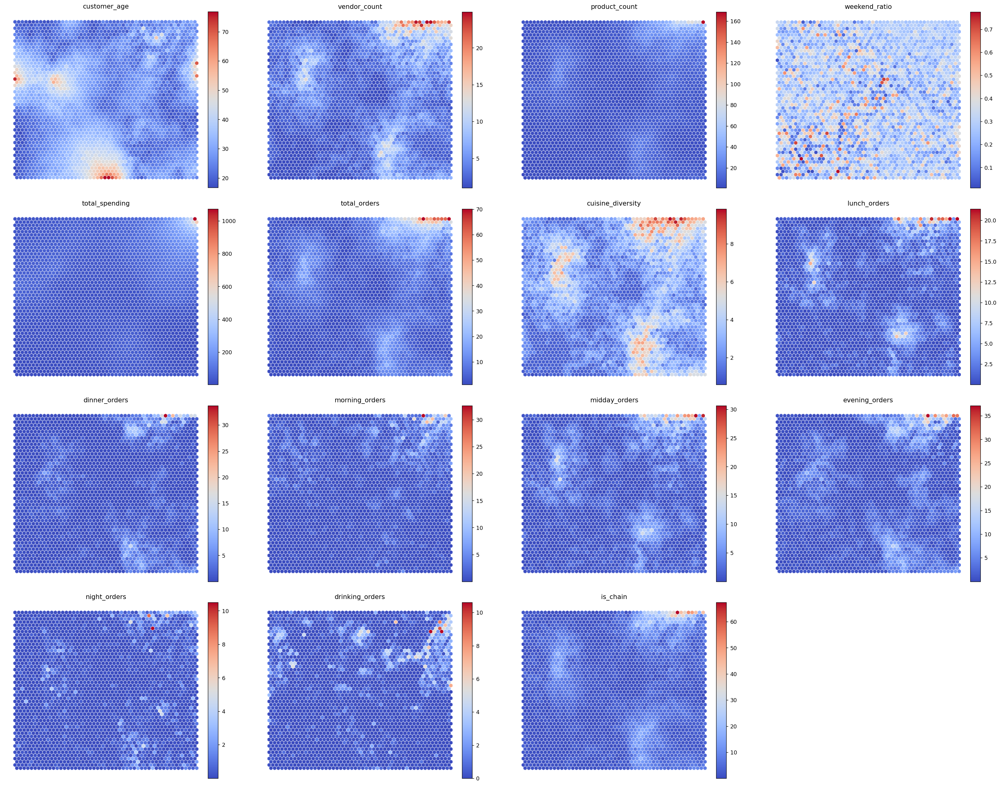

In [66]:
##############################
# Plot Component Planes
##############################

weights = sm.get_weights()

figsize=(25,20)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(4,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(metric_features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=metric_features[cpi],
                    cmap=cm.coolwarm,
                    )

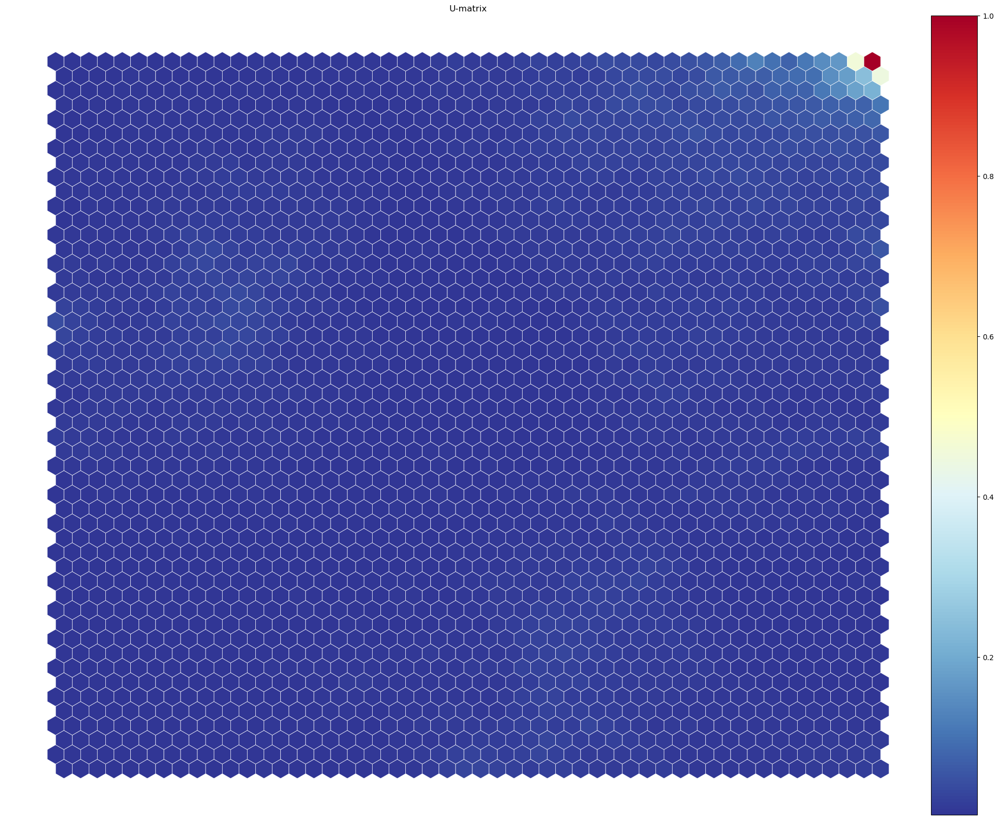

In [67]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    )

In [68]:
umatrix.shape

(50, 50)

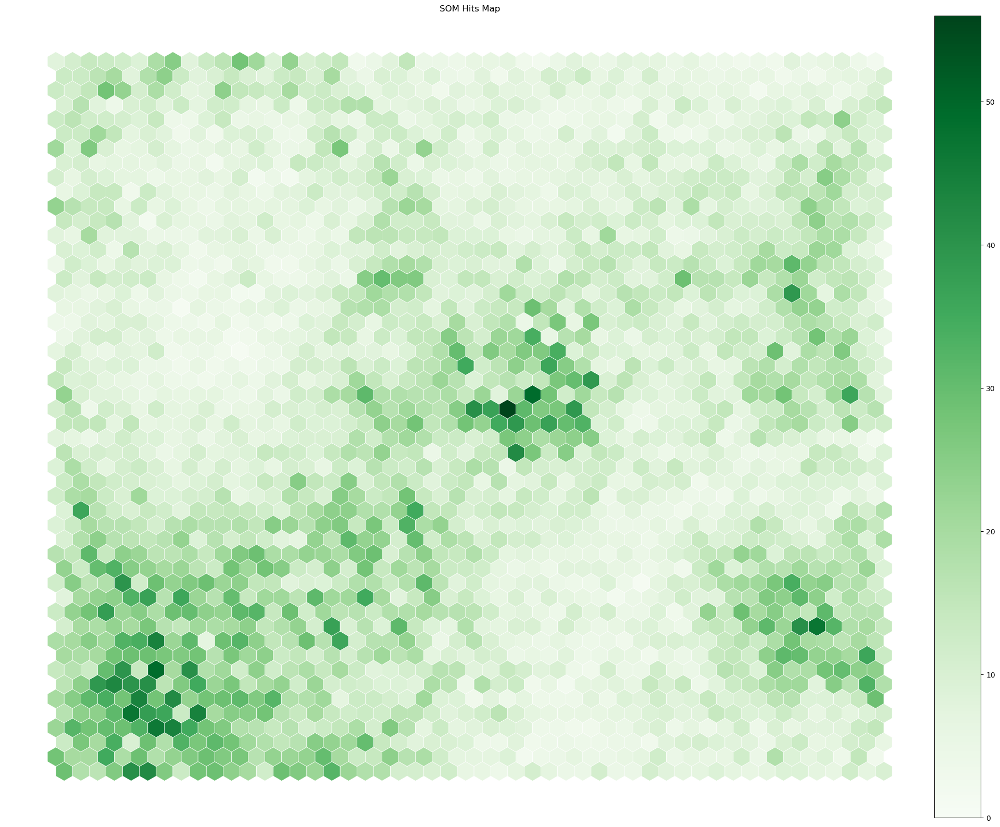

In [69]:
hitsmatrix = sm.activation_response(df[metric_features].values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    )

### K-Means on top of SOM units
- Define number of clusters to retain

In [70]:
weights_flat = sm.get_weights().reshape((M*N),len(metric_features))
weights_flat.shape

(2500, 15)

In [71]:
# Perform K-Means clustering on top of the MxN units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)
nodeclus_labels

array([0, 0, 0, ..., 3, 3, 3], dtype=int32)

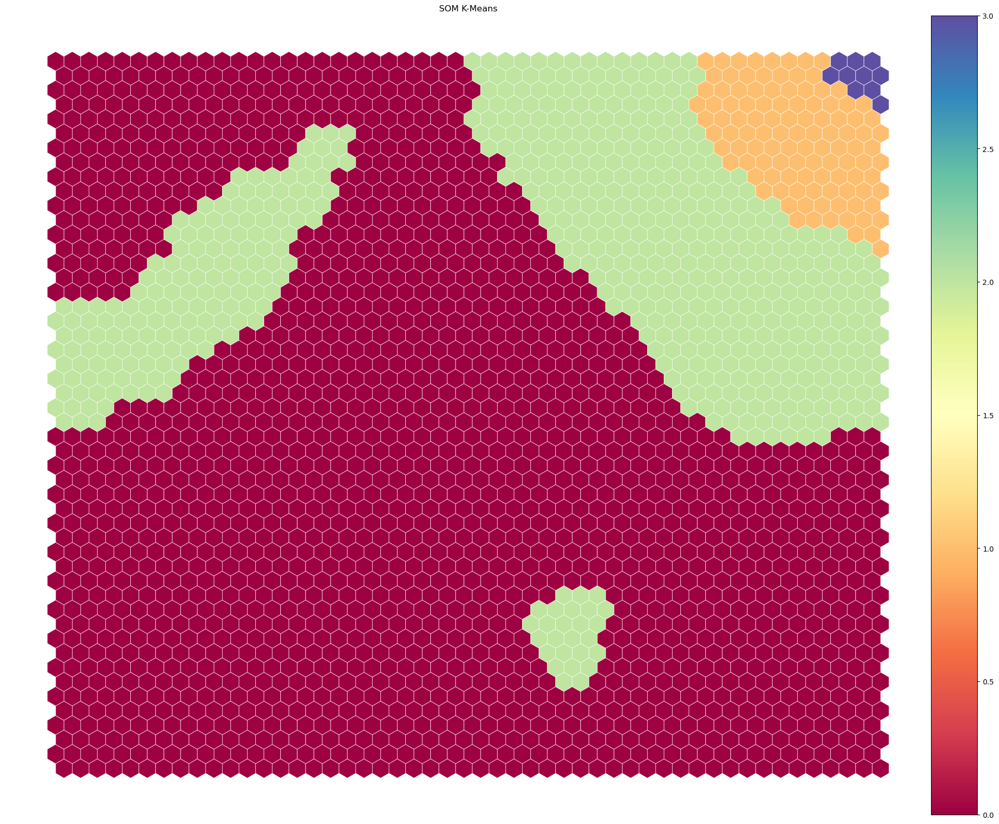

In [72]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

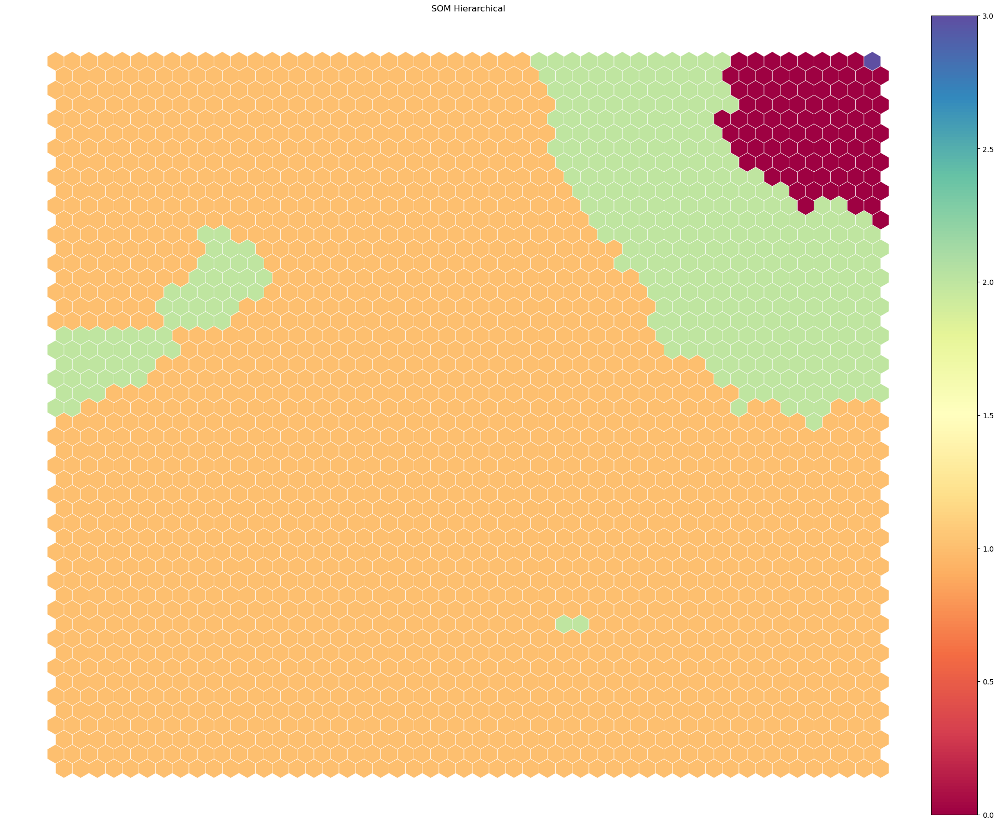

In [73]:
# Perform Hierarchical clustering on top of the MxN units 

hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels = hierclust.fit_predict(weights_flat)
hclust_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hclust_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hclust_matrix,
                    label="SOM Hierarchical",
                    cmap=cm.Spectral,
                    )

In [74]:
# Check the nodes and and respective clusters
nodes = weights_flat

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,customer_age,vendor_count,product_count,weekend_ratio,total_spending,total_orders,cuisine_diversity,lunch_orders,dinner_orders,morning_orders,midday_orders,evening_orders,night_orders,drinking_orders,is_chain,label
0,19.288069,1.017159,1.018125,0.539677,1.363724,1.018125,0.825473,0.013097,0.209936,0.051917,0.022628,0.922418,0.019179,0.001982,0.879195,1
1,17.550080,1.006724,1.007253,0.043434,1.548054,1.007253,0.994646,0.248437,0.013766,0.062676,0.597026,0.072149,0.126811,0.148590,0.942307,1
2,17.381264,1.073901,1.099160,0.386043,3.560662,1.096409,1.037469,0.069833,0.192751,0.189569,0.096161,0.483555,0.121110,0.206014,0.721988,1
3,16.711307,1.033341,1.042142,0.118681,5.879785,1.034646,1.032505,0.059089,0.196857,0.401327,0.147876,0.236505,0.006021,0.242917,0.505039,1
4,18.219862,1.763577,1.962613,0.231993,5.520991,1.950741,1.702978,0.153941,0.136584,0.122138,0.579183,0.492250,0.496598,0.260571,1.025250,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,28.417943,11.191826,37.814928,0.334913,310.615384,24.745392,5.088844,3.684509,2.191375,5.792583,5.841927,7.988982,1.467361,3.654539,9.771834,0
2496,24.801042,12.219730,31.054857,0.221082,366.456954,16.372670,3.753368,2.517948,0.620256,3.590859,4.730105,1.580767,2.737636,3.733304,5.919340,0
2497,25.435423,12.406129,44.536260,0.287865,459.912754,21.747473,4.695122,3.250303,0.698888,7.557821,5.350465,2.811065,0.875905,5.152217,4.882626,0
2498,27.849857,14.441522,59.521174,0.276156,643.668829,34.196459,5.116824,5.906740,1.454893,9.619707,12.300021,5.832480,3.080307,3.363945,17.152086,0


In [75]:
## This gets BMU coordinates, e.g. (4,4) for each data point
bmu_index = np.array([sm.winner(x) for x in df[metric_features].values])

print(bmu_index.shape)

bmu_index

(31737, 2)


array([[46, 20],
       [ 1, 14],
       [16,  6],
       ...,
       [27, 25],
       [15,  9],
       [11,  6]])

In [76]:

## This gets the cluster label from hclust_matrix, i.e.
## if data row 0 has BMU at (37, 28) 
## it will get the label associated to node (37,28) using label associated to hclust_matrix[37,28] above

som_final_labels = [hclust_matrix[i[0]][i[1]] for i in bmu_index]

df_final = pd.concat([
                df,
                pd.Series(som_final_labels, name='label', index=df.index)
            ], axis=1
            )

df_final


,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,...,lunch_orders,dinner_orders,meal_preference,morning_orders,midday_orders,evening_orders,night_orders,drinking_orders,primary_time_period,label
0,1b8f824d5e,2360,18,2,5,1,0,1,DELIVERY,DIGI,...,0,2,dinner,0,0,2,0,0,evening,1
1,5d272b9dcb,8670,17,2,2,2,0,1,DISCOUNT,DIGI,...,1,0,lunch,1,1,0,0,0,morning,1
2,f6d1b2ba63,4660,38,1,2,2,0,1,DISCOUNT,CASH,...,1,0,lunch,1,1,0,0,0,morning,1
3,180c632ed8,4660,24,2,3,1,0,2,DELIVERY,DIGI,...,1,0,lunch,0,2,0,0,0,midday,1
4,4eb37a6705,4660,20,2,5,0,0,2,-,DIGI,...,0,0,dinner,2,0,0,0,0,morning,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31732,f4e366c281,8670,30,1,1,1,34,0,FREEBIE,DIGI,...,1,0,lunch,0,1,0,0,0,midday,1
31733,f6b6709018,8670,27,1,1,0,28,0,DELIVERY,DIGI,...,0,0,dinner,0,0,1,0,0,evening,1
31734,f74ad8ce3f,8670,24,1,1,1,12,0,-,DIGI,...,0,0,dinner,0,0,0,0,1,drinking,1
31735,f7b19c0241,8670,34,1,1,0,7,0,DISCOUNT,DIGI,...,1,0,lunch,0,1,0,0,0,midday,1


In [77]:
# Characterizing the final clusters
df_final[metric_features+['label']].groupby('label').mean()

,customer_age,vendor_count,product_count,weekend_ratio,total_spending,total_orders,cuisine_diversity,lunch_orders,dinner_orders,morning_orders,midday_orders,evening_orders,night_orders,drinking_orders,is_chain
label,,,,,,,,,,,,,,,
0,27.455982,9.911964,28.711061,0.282651,227.168172,19.714447,4.586907,3.802483,2.132054,5.356659,6.020316,5.167043,0.836343,2.334086,10.665914
1,27.427354,2.471226,3.813079,0.290594,22.592190,3.120329,1.990620,0.682025,0.587631,0.517003,1.035314,1.143087,0.163789,0.261136,2.128961
2,27.980435,5.855466,12.922719,0.288603,92.095378,9.329420,3.519442,1.941551,1.341404,2.016385,2.985571,2.868183,0.408413,1.050868,5.693813
3,28.500000,22.000000,182.000000,0.315800,1160.500000,74.000000,7.000000,25.500000,15.500000,2.500000,35.500000,33.000000,3.000000,0.000000,44.500000


R^2 Error Calculation 

In [78]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_final[metric_features])  # get total sum of squares
ssw_labels = df_final[metric_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

/var/folders/vw/pymryqyn3hv91xzpkt7_kblw0000gn/T/ipykernel_67178/1206687926.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = df_final[metric_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels


0.7405202401010028

The quantization error is given by the average distance between a unit and the data points mapped to it i.e. all the input data points that share it as BMU.

In [79]:
sm.quantization_error(som_data)

2.9003340224966183

In [80]:
sm.topographic_error(som_data)

0.5439707596811293

<h1>Claude</h1>

In [86]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from minisom import MiniSom
import matplotlib.pyplot as plt

# Load data
#df = pd.read_csv('your_preprocessed_data.csv')

# Select features for clustering
features = [
    'customer_age', 'vendor_count', 'product_count', 'weekend_ratio', 
    'total_spending', 'total_orders', 'cuisine_diversity', 
    'lunch_orders', 'dinner_orders', 'morning_orders', 
    'midday_orders', 'evening_orders', 'night_orders', 
    'drinking_orders', 'is_chain'
]

# Prepare data
X = df[features]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create and train SOM
som_shape = (6, 6)  # 6x6 grid
som = MiniSom(
    som_shape[0], som_shape[1], 
    X_scaled.shape[1],  # number of features
    sigma=1.0, 
    learning_rate=0.5
)

# Initialize weights
som.random_weights_init(X_scaled)

# Train the SOM
som.train_random(X_scaled, 1000)  # 1000 iterations

# Get cluster assignments
win_map = som.win_map(X_scaled)
cluster_labels = np.zeros(X_scaled.shape[0])

for i, x in enumerate(X_scaled):
    winning_neuron = som.winner(x)
    cluster_labels[i] = winning_neuron[0] * som_shape[1] + winning_neuron[1]

# Add cluster labels to original dataframe
df['SOM_Cluster'] = cluster_labels

In [90]:
# Cluster Characterization
cluster_profiles = df.groupby('SOM_Cluster')[features].mean()
print(cluster_profiles)

# Visualize cluster characteristics
# plt.figure(figsize=(12, 8))
# cluster_profiles.T.plot(kind='bar')
# plt.title('Cluster Characteristics')
# plt.tight_layout()

             customer_age  vendor_count  product_count  weekend_ratio  \
SOM_Cluster                                                             
0.0             23.420970      3.549296       5.200313       0.438162   
1.0             30.435943      3.850534       7.238434       0.258548   
2.0             50.225617      2.462985       3.776733       0.269963   
3.0             37.752593      1.795643       2.639004       0.267355   
4.0             32.216545      2.523114       4.379562       0.393981   
5.0             27.296443      7.179842      14.652174       0.262704   
6.0             27.086538      5.512019      13.170673       0.275100   
7.0             25.345291      6.959641      11.029148       0.277297   
8.0             39.399185      4.197556       7.122200       0.281606   
9.0             25.032572      2.613499       4.249496       0.099989   
10.0            23.504762      2.649524       3.828571       0.246653   
11.0            26.354785      4.975248       8.580

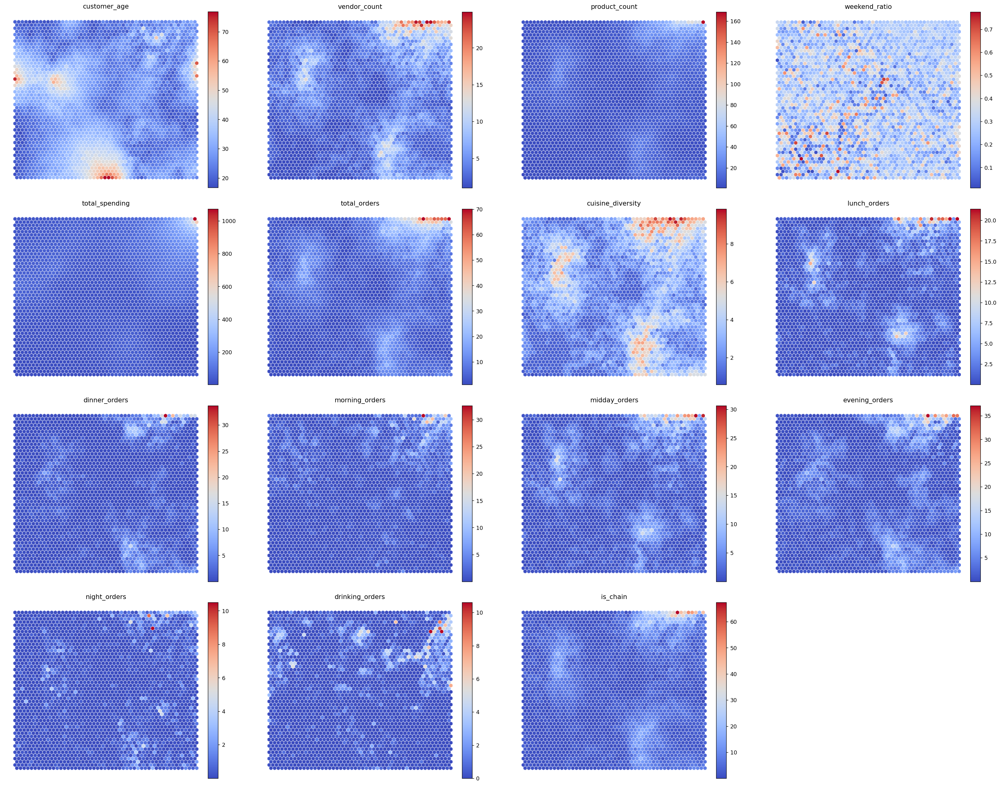

In [91]:
##############################
# Plot Component Planes
##############################

weights = sm.get_weights()

figsize=(25,20)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(4,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(metric_features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))

    matrix_vals = weights[:,:,cpi]
    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=metric_features[cpi],
                    cmap=cm.coolwarm,
                    )

SOM with just morning_orders, midday_orders, evening_order, night_orders, drinking_orders

In [93]:
# Select features for clustering
features = [
    'morning_orders', 'midday_orders', 'evening_orders', 'night_orders', 'drinking_orders'
]

# Prepare data
X = df[features]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create and train SOM
som_shape = (6, 6)  # 6x6 grid
som = MiniSom(
    som_shape[0], som_shape[1], 
    X_scaled.shape[1],  # number of features
    sigma=1.0, 
    learning_rate=0.5
)

# Initialize weights
som.random_weights_init(X_scaled)

# Train the SOM
som.train_random(X_scaled, 1000)  # 1000 iterations

# Get cluster assignments
win_map = som.win_map(X_scaled)
cluster_labels = np.zeros(X_scaled.shape[0])

for i, x in enumerate(X_scaled):
    winning_neuron = som.winner(x)
    cluster_labels[i] = winning_neuron[0] * som_shape[1] + winning_neuron[1]

# Add cluster labels to original dataframe
df['SOM_Cluster'] = cluster_labels

In [97]:
cluster_profiles2 = df.groupby('SOM_Cluster')[features].mean()
print(cluster_profiles2)

             morning_orders  midday_orders  evening_orders  night_orders  \
SOM_Cluster                                                                
0.0                0.119940       1.368816        0.229385      0.000000   
1.0                0.014065       0.134597        1.687634      0.000000   
2.0                0.136483       0.611549        3.853018      0.000000   
3.0                0.267606       1.401408        2.992958      1.021127   
4.0                0.504975       1.905473        3.121891      2.907960   
5.0                1.560000       3.725000        3.485000      6.355000   
6.0                0.231088       3.588601        0.106736      0.033161   
7.0                0.054930       1.352279        0.346748      0.000000   
8.0                0.442593       2.000000        1.866667      0.000000   
9.0                1.024530       0.374328        0.460013      0.000000   
10.0               0.282126       0.537967        0.511682      1.147780   
11.0        

In [104]:
# Cluster Characterization
cluster_profiles2 = df.groupby('SOM_Cluster')[features].mean()
print(cluster_profiles2)

# Visualize cluster characteristics
# plt.figure(figsize=(12, 8))
# cluster_profiles2.T.plot(kind='bar')
# plt.title('Cluster Characteristics')
# plt.tight_layout()
# plt.show()
# plt.tight_layout()

             morning_orders  midday_orders  evening_orders  night_orders  \
SOM_Cluster                                                                
0.0                0.119940       1.368816        0.229385      0.000000   
1.0                0.014065       0.134597        1.687634      0.000000   
2.0                0.136483       0.611549        3.853018      0.000000   
3.0                0.267606       1.401408        2.992958      1.021127   
4.0                0.504975       1.905473        3.121891      2.907960   
5.0                1.560000       3.725000        3.485000      6.355000   
6.0                0.231088       3.588601        0.106736      0.033161   
7.0                0.054930       1.352279        0.346748      0.000000   
8.0                0.442593       2.000000        1.866667      0.000000   
9.0                1.024530       0.374328        0.460013      0.000000   
10.0               0.282126       0.537967        0.511682      1.147780   
11.0        

/var/folders/vw/pymryqyn3hv91xzpkt7_kblw0000gn/T/ipykernel_67178/3723946728.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


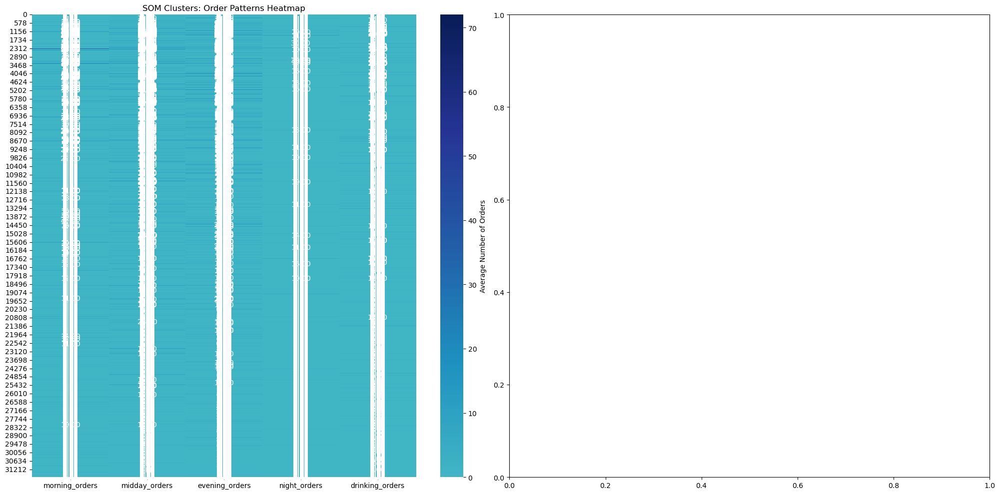

ValueError: Image size of 1795x664786 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2000x1000 with 1 Axes>

KeyError: 'index'

<Figure size 2000x1000 with 0 Axes>

In [109]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the SOM cluster data
cluster_data = df

# Visualization 1: Heatmap of Order Patterns
plt.figure(figsize=(20, 10))
order_columns = ['morning_orders', 'midday_orders', 'evening_orders', 'night_orders', 'drinking_orders']

plt.subplot(1, 2, 1)
sns.heatmap(cluster_data[order_columns], 
            cmap='YlGnBu', 
            center=0, 
            annot=True, 
            fmt='.2f', 
            cbar_kws={'label': 'Average Number of Orders'})
plt.title('SOM Clusters: Order Patterns Heatmap')
plt.tight_layout()

# Visualization 2: Cluster Order Patterns Comparison
plt.subplot(1, 2, 2)
cluster_data[order_columns].T.plot(kind='bar', 
                                    figsize=(20, 10), 
                                    width=0.8)
plt.title('Comparative Order Patterns Across SOM Clusters')
plt.xlabel('Time of Day')
plt.ylabel('Average Number of Orders')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

# Visualization 3: Parallel Coordinates Plot
plt.figure(figsize=(20, 10))
pd.plotting.parallel_coordinates(cluster_data[order_columns], 
                                  'index', 
                                  colormap='viridis')
plt.title('Parallel Coordinates: Order Patterns Across SOM Clusters')
plt.xlabel('Order Type')
plt.ylabel('Normalized Order Count')
plt.tight_layout()
plt.show()

# Descriptive Statistics
print("Descriptive Statistics of Order Patterns:")
print(cluster_data[order_columns].describe())

# Identify Top 5 Clusters for Each Order Type
print("\nTop 5 Clusters by Order Type:")
for col in order_columns:
    print(f"\nTop 5 Clusters - {col}:")
    print(cluster_data[col].nlargest(5))

# Clustering Pattern Analysis
cluster_profile = cluster_data[order_columns].apply(
    lambda x: pd.cut(x, bins=4, labels=['Very Low', 'Low', 'Medium', 'High']).value_counts()
)
print("\nCluster Order Pattern Distribution:")
print(cluster_profile)

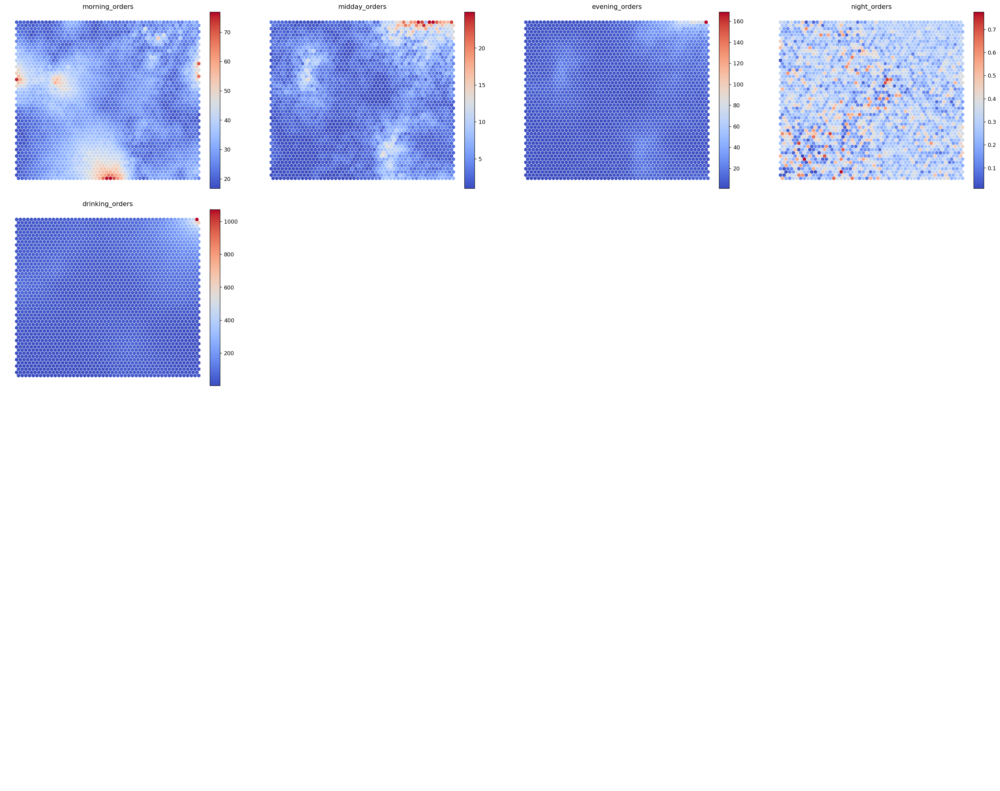

In [99]:
##############################
# Plot Component Planes
##############################

weights = sm.get_weights()
figsize=(25,20)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(4,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))

    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=features[cpi],
                    cmap=cm.coolwarm,
                    )